In [1]:
!git clone -l -s https://github.com/asteroid-team/asteroid.git asteroid

Cloning into 'asteroid'...
remote: Enumerating objects: 7684, done.
remote: Counting objects: 100% (307/307), done.
remote: Compressing objects: 100% (193/193), done.
remote: Total 7684 (delta 143), reused 248 (delta 111), pack-reused 7377
Receiving objects: 100% (7684/7684), 5.98 MiB | 9.50 MiB/s, done.
Resolving deltas: 100% (4837/4837), done.


In [2]:
%cd asteroid

/content/asteroid


In [3]:
! pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 163 kB 36.8 MB/s 
     |████████████████████████████████| 798 kB 55.0 MB/s 
     |████████████████████████████████| 72 kB 1.3 MB/s 
     |████████████████████████████████| 59 kB 9.4 MB/s 
     |████████████████████████████████| 529 kB 65.1 MB/s 
     |████████████████████████████████| 87 kB 6.5 MB/s 
     |████████████████████████████████| 90 kB 8.9 MB/s 
     |████████████████████████████████| 41 kB 563 kB/s 
  Created wheel for torch-stoi: filename=torch_stoi-0.1.2-py3-none-any.whl size=6199 sha256=e9ff17c2d2e7049835562271eab10b6de4991ab5c09a756a9ab980ffe03abc11
  Stored in directory: /root/.cache/pip/wheels/1b/19/61/e402d07c636ff1c4465ee623adb8bb5a92d931737a73a16574
  Created wheel for julius: filename=julius-0.2.7-py3-none-any.whl size=21907 sha256=9cecbd3f20e04b061d1a08acf4f954033552f7f6aa8dc24ac43009a0c0bf4d8f
  Stored in directory: /root/.cac

In [4]:
!wget https://www.merl.com/demos/deep-clustering/media/female-female-mixture.wav

--2022-11-16 10:14:19--  https://www.merl.com/demos/deep-clustering/media/female-female-mixture.wav
Resolving www.merl.com (www.merl.com)... 137.203.190.5
Connecting to www.merl.com (www.merl.com)|137.203.190.5|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 168680 (165K) [audio/x-wav]
Saving to: ‘female-female-mixture.wav’

female-female-mixtu 100%[===================>] 164.73K   599KB/s    in 0.3s    

2022-11-16 10:14:20 (599 KB/s) - ‘female-female-mixture.wav’ saved [168680/168680]



In [5]:
from IPython.display import display, Audio

display(Audio("female-female-mixture.wav"))

## Separate Mixture File

In [6]:
from asteroid.models import BaseModel
import soundfile as sf

# 'from_pretrained' automatically uses the right model class (asteroid.models.DPRNNTasNet).
model = BaseModel.from_pretrained("mpariente/DPRNNTasNet-ks2_WHAM_sepclean")

# You can pass a NumPy array:
mixture, _ = sf.read("female-female-mixture.wav", dtype="float32", always_2d=True)
# Soundfile returns the mixture as shape (time, channels), and Asteroid expects (batch, channels, time)
mixture = mixture.transpose()
mixture = mixture.reshape(1, mixture.shape[0], mixture.shape[1])
out_wavs = model.separate(mixture)

# Or simply a file name:
model.separate("female-female-mixture.wav")



Downloading:   0%|          | 0.00/14.7M [00:00<?, ?B/s]

In [7]:
%%capture
!pip install librosa

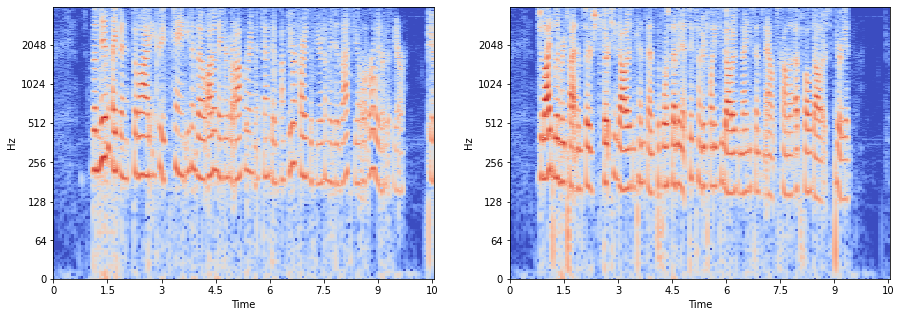

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display


def show_magspec(waveform, **kw):
    return librosa.display.specshow(
        librosa.amplitude_to_db(np.abs(librosa.stft(waveform))),
        y_axis="log", x_axis="time",
        **kw
    )


est1 = sf.read("female-female-mixture_est1.wav")[0]
est2 = sf.read("female-female-mixture_est2.wav")[0]

fig, ax = plt.subplots(1, 2, figsize=(15, 5))
show_magspec(est1, sr=8000, ax=ax[0])
show_magspec(est2, sr=8000, ax=ax[1])

In [12]:
display(Audio("female-female-mixture_est1.wav"))
display(Audio("female-female-mixture_est2.wav"))

ValueError: ignored

## Get LibriMix data for Demucs

In [15]:
LibriMix.mini_download()

'./MiniLibriMix/metadata'

## Train own model

In [16]:
# Asteroid is based on PyTorch and PyTorch-Lightning.
from torch import optim
from pytorch_lightning import Trainer

# We train the same model architecture that we used for inference above.
from asteroid.models import DPRNNTasNet

# In this example we use Permutation Invariant Training (PIT) and the SI-SDR loss.
from asteroid.losses import pairwise_neg_sisdr, PITLossWrapper

# MiniLibriMix is a tiny version of LibriMix (https://github.com/JorisCos/LibriMix),
# which is a free speech separation dataset.
from asteroid.data import LibriMix

# Asteroid's System is a convenience wrapper for PyTorch-Lightning.
from asteroid.engine import System

# This will automatically download MiniLibriMix from Zenodo on the first run.
train_loader, val_loader = LibriMix.loaders_from_mini(task="sep_clean", batch_size=16)

# Tell DPRNN that we want to separate to 2 sources.
model = DPRNNTasNet(n_src=2)

# PITLossWrapper works with any loss function.
loss = PITLossWrapper(pairwise_neg_sisdr, pit_from="pw_mtx")

optimizer = optim.Adam(model.parameters(), lr=1e-3)

system = System(model, optimizer, loss, train_loader, val_loader)

# Train for 1 epoch using a single GPU. If you're running this on Google Colab,
# be sure to select a GPU runtime (Runtime → Change runtime type → Hardware accelarator).
trainer = Trainer(max_epochs=100, gpus=1)
trainer.fit(system)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type           | Params
---------------------------------------------
0 | model     | DPRNNTasNet    | 3.7 M 
1 | loss_func | PITLossWrapper | 0     
---------------------------------------------
3.7 M     Trainable params
0         Non-trainable params
3.7 M     Total params
14.611    Total estimated model params size (MB)


Drop 0 utterances from 800 (shorter than 3 seconds)
Drop 0 utterances from 200 (shorter than 3 seconds)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


In [25]:
%reload_ext tensorboard
%tensorboard --logdir=lightning_logs/version_2/

<IPython.core.display.Javascript object>

In [20]:
!wget https://www.merl.com/demos/deep-clustering/media/male-male-mixture.wav

model.separate("male-male-mixture.wav", force_overwrite=True)

--2022-11-16 13:17:14--  https://www.merl.com/demos/deep-clustering/media/male-male-mixture.wav
Resolving www.merl.com (www.merl.com)... 137.203.190.5
Connecting to www.merl.com (www.merl.com)|137.203.190.5|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 83328 (81K) [audio/x-wav]
Saving to: ‘male-male-mixture.wav’

male-male-mixture.w 100%[===================>]  81.38K  --.-KB/s    in 0.03s   

2022-11-16 13:17:14 (2.88 MB/s) - ‘male-male-mixture.wav’ saved [83328/83328]



## save model

In [23]:
import torch
torch.save(model.state_dict(), 'dprnn_1.pth')

In [21]:
from IPython.display import display, Audio

display(Audio("male-male-mixture_est1.wav"))
display(Audio("male-male-mixture_est2.wav"))

In [22]:
display(Audio("male-male-mixture.wav"))
